In [4]:
import numpy as np

import librosa
from IPython.display import Audio

import tsaug
from tsaug.visualization import plot

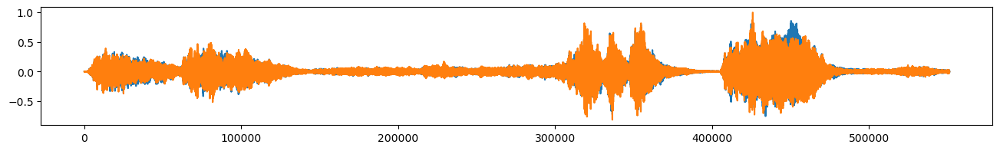

In [5]:
# load the audio data 
# First load the file into Jupyter via "Upload Files"
beethoven, samplerate = librosa.load("./beethoven.wav", mono=False)
beethoven = np.expand_dims(beethoven.swapaxes(0,1), 0) # reshape to input of tsaug
plot(beethoven);

In [6]:
Audio(beethoven.reshape(-1, 2).T, rate=samplerate)

In [7]:
# Perform data augmentation

# Use the following augmenters:
# - random crop subsequences of 10 seconds,
# - with 50% probability, add random noise up to 1% - 5%,
# drop out 10% of the time points and fill the dropped out points with zeros.

from tsaug import Crop, AddNoise, Dropout
n_augmentations = 5

my_augmenter = (
     Crop(size=samplerate * 10) * n_augmentations  
     + AddNoise(scale=(0.01, 0.05)) @ 0.5  
     + Dropout(
         p=0.1,
         fill=0,
         size=[int(0.001 * samplerate), int(0.01 * samplerate), int(0.1 * samplerate)]
     )  
)

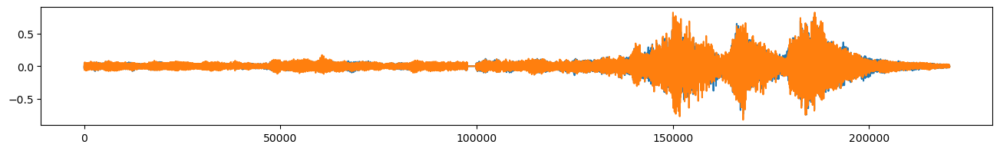

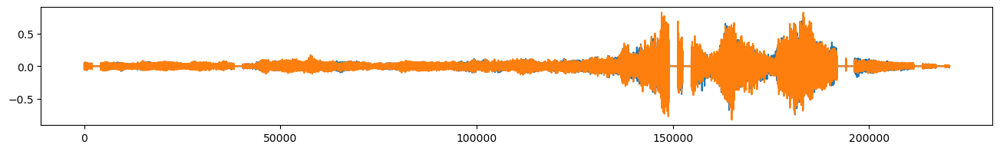

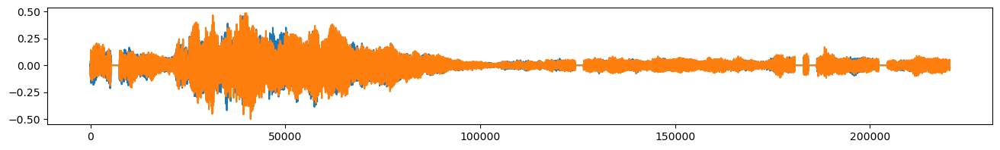

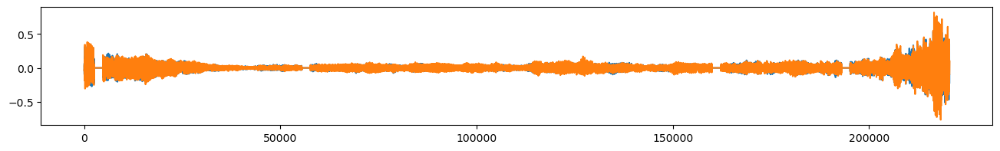

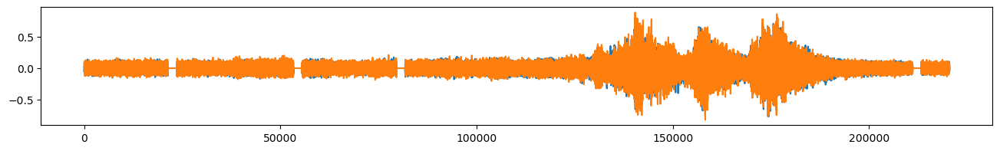

In [18]:
beethoven_aug = my_augmenter.augment(beethoven)
for i in range(n_augmentations):
    plot(beethoven_aug[[i]])

In [9]:
Audio(beethoven_aug[0].reshape(-1, 2).T, rate=samplerate)

In [10]:
Audio(beethoven_aug[1].reshape(-1, 2).T, rate=samplerate)

In [11]:
# --->>> Your turn <<<---
# Try it yourself
# See here for a list of other augmenters:
# https://tsaug.readthedocs.io/en/stable/notebook/Examples%20of%20augmenters.html

In [12]:
# Perform data augmentation

from tsaug import Crop, Convolve, Drift, Pool, TimeWarp, Quantize
n_augmentations = 5

my_augmenter2 = ( 
     Convolve(window="flattop", size=11) * n_augmentations  
     + Drift(max_drift=0.3, n_drift_points=3)
     + Pool(size=2) @ 0.5
     + Quantize(n_levels=20) 
     + TimeWarp(n_speed_change=2, max_speed_ratio=2)
)

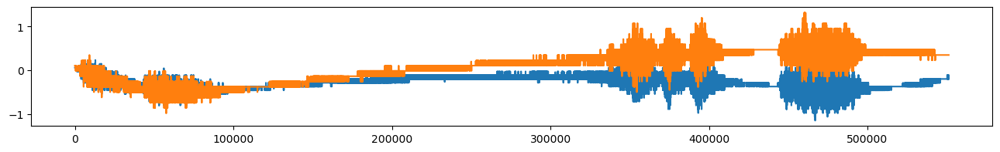

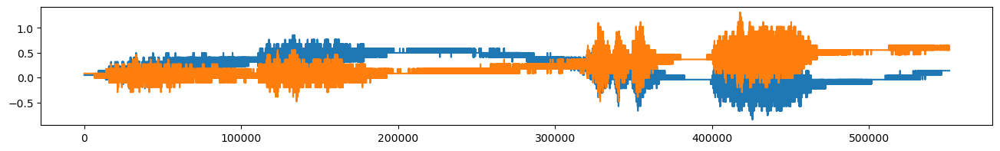

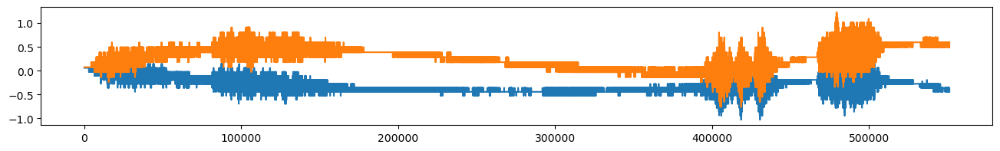

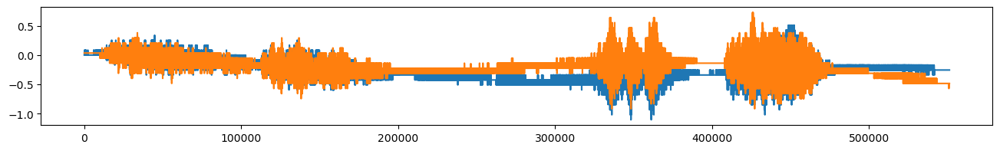

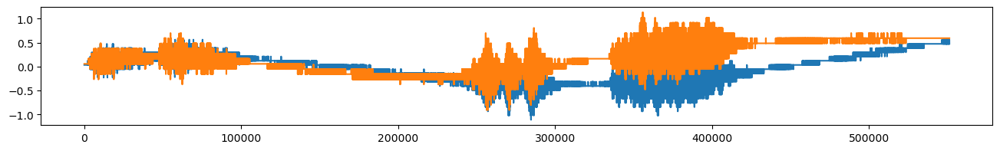

In [13]:
beethoven_aug = my_augmenter2.augment(beethoven)
for i in range(n_augmentations):
    plot(beethoven_aug[[i]])

In [14]:
Audio(beethoven_aug[0].reshape(-1, 2).T, rate=samplerate)

In [15]:
Audio(beethoven_aug[1].reshape(-1, 2).T, rate=samplerate)

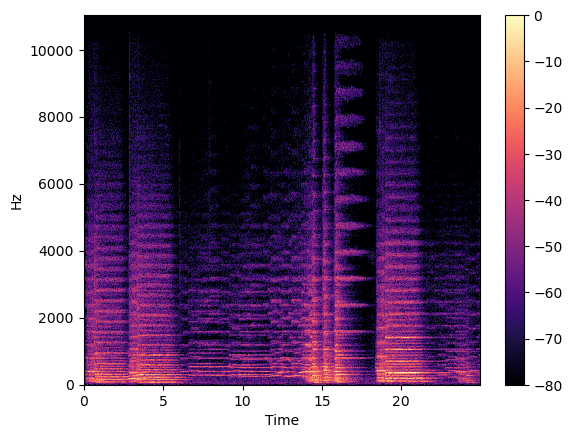

In [16]:
# Comment: it is very popular to transform audio to spectrograms
# Thus you transform an audio file (1-d timeseries) to a 2-d image 
# where you can use popular image classification or object detection models
# see https://librosa.org/doc/main/auto_examples/plot_display.html
import matplotlib.pyplot as plt
y, sr = librosa.load("./beethoven.wav", mono=True)
D = librosa.stft(y)  # STFT of y
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
plt.figure()
librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='linear')
plt.colorbar()

[Text(0.5, 1.0, 'Mel-frequency spectrogram')]

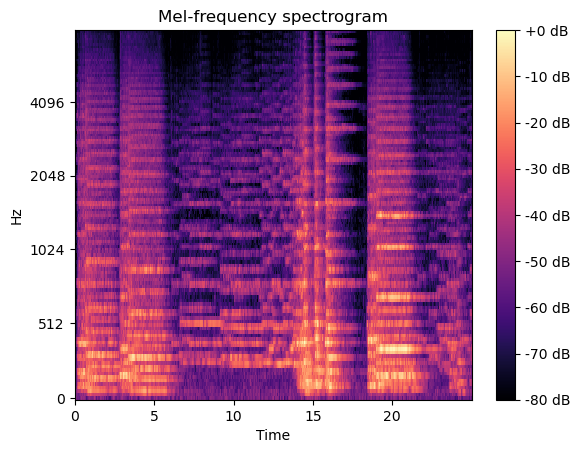

In [17]:
#melspectrogram transform the frequency axis to resemble more how humans perceive tone height
# Passing through arguments to the Mel filters
# see https://librosa.org/doc/main/generated/librosa.feature.melspectrogram.html
S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128,
                                    fmax=8000)
fig, ax = plt.subplots()
S_dB = librosa.power_to_db(S, ref=np.max)
img = librosa.display.specshow(S_dB, x_axis='time',
                         y_axis='mel', sr=sr,
                         fmax=8000, ax=ax)
fig.colorbar(img, ax=ax, format='%+2.0f dB')
ax.set(title='Mel-frequency spectrogram')